# Importação de Bibliotecas e Reprodutibilidade

In [2]:
import os
import sys
import numpy as np
import tensorflow as tf

# Reforça comportamento determinístico do TensorFlow
os.environ['TF_DETERMINISTIC_OPS'] = '1'
# Filtra mensagens de log de baixa severidade do TensorFlow
os.environ['TF_CPP_MIN_LOG_LEVEL'] = '2'

# Definindo valor para reprodutibilidade
np.random.seed(42)
tf.random.set_seed(42)

print("Versão do Python:")
print(sys.version)
print(sys.version_info)

print("\nVersão do NumPy:")
print(np.__version__)

print("\nVersão do TensorFlow:")
print(tf.__version__)

Versão do Python:
3.9.16 (main, Mar  8 2023, 14:00:05) 
[GCC 11.2.0]
sys.version_info(major=3, minor=9, micro=16, releaselevel='final', serial=0)

Versão do NumPy:
1.23.5

Versão do TensorFlow:
2.10.0


# Download do Conjunto de Dados Inicial

O dataset consiste de uma única imagem de um manômetro, manipulada digitalmente para simular a posição do ponteiro em 13 pontos distintos do range do equipamento (0 - 6 bar).

**Processo de Manipulação Digital**

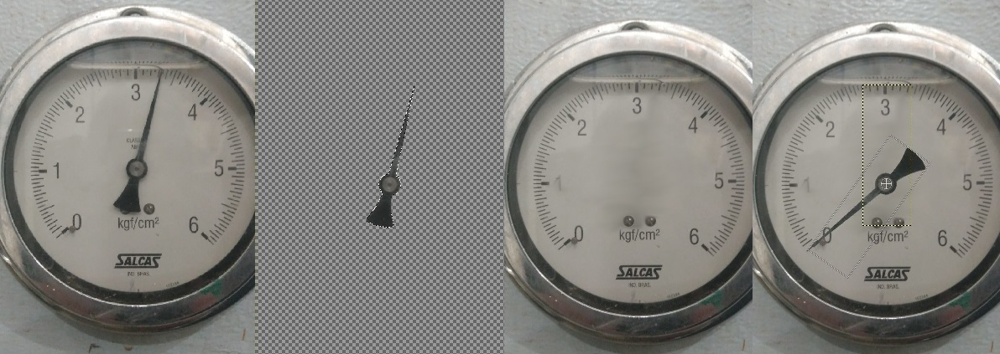

In [ ]:
# Os dados estão disponíveis publicamente através do link abaixo:

!wget --no-check-certificate 'https://drive.google.com/uc?export=download&id=1Kl5hc0O3WUBc6OLDFXTUV-1j3sp_Pafh' -O 'Classes.zip'

/usr/bin/zsh: /home/junior/miniconda3/envs/tf/lib/libncursesw.so.6: no version information available (required by /usr/bin/zsh)
--2023-04-19 19:08:14--  https://drive.google.com/uc?export=download&id=1Kl5hc0O3WUBc6OLDFXTUV-1j3sp_Pafh
Loaded CA certificate '/etc/ssl/certs/ca-certificates.crt'
Resolving drive.google.com (drive.google.com)... 2800:3f0:4001:82f::200e, 142.251.129.142
Connecting to drive.google.com (drive.google.com)|2800:3f0:4001:82f::200e|:443... connected.
HTTP request sent, awaiting response... 303 See Other
Location: https://doc-10-3g-docs.googleusercontent.com/docs/securesc/ha0ro937gcuc7l7deffksulhg5h7mbp1/rqiqo9cv5d1dpto9gl0blkgsksqg411o/1681942050000/10712319952389096693/*/1Kl5hc0O3WUBc6OLDFXTUV-1j3sp_Pafh?e=download&uuid=80b1ca39-49d1-4a45-9d45-1e02fba75987 [following]
--2023-04-19 19:08:15--  https://doc-10-3g-docs.googleusercontent.com/docs/securesc/ha0ro937gcuc7l7deffksulhg5h7mbp1/rqiqo9cv5d1dpto9gl0blkgsksqg411o/1681942050000/10712319952389096693/*/1Kl5hc0O3WUB

In [ ]:
# A função a seguir descompacta o arquivo Classes.zip
import zipfile

zip_ref = zipfile.ZipFile("Classes.zip")
zip_ref.extractall()
zip_ref.close()

# Inspecionando os Dados

In [3]:
# Listando os diretórios do arquivo descompactado

!ls Classes

/usr/bin/zsh: /home/junior/miniconda3/envs/tf/lib/libncursesw.so.6: no version information available (required by /usr/bin/zsh)
0  0_5	1  1_5	2  2_5	3  3_5	4  4_5	5  5_5	6


In [4]:
# Listando os diretórios e arquivos internos

for dirpath, dirnames, filenames in os.walk("Classes"):
  print(f"Existem {len(dirnames)} diretórios e {len(filenames)} imagens na pasta '{dirpath}'")

Existem 13 diretórios e 0 imagens na pasta 'Classes'
Existem 0 diretórios e 200 imagens na pasta 'Classes/1_5'
Existem 0 diretórios e 200 imagens na pasta 'Classes/5_5'
Existem 0 diretórios e 200 imagens na pasta 'Classes/2'
Existem 0 diretórios e 200 imagens na pasta 'Classes/2_5'
Existem 0 diretórios e 200 imagens na pasta 'Classes/0_5'
Existem 0 diretórios e 200 imagens na pasta 'Classes/4_5'
Existem 0 diretórios e 200 imagens na pasta 'Classes/3'
Existem 0 diretórios e 200 imagens na pasta 'Classes/3_5'
Existem 0 diretórios e 200 imagens na pasta 'Classes/6'
Existem 0 diretórios e 200 imagens na pasta 'Classes/1'
Existem 0 diretórios e 200 imagens na pasta 'Classes/0'
Existem 0 diretórios e 200 imagens na pasta 'Classes/5'
Existem 0 diretórios e 200 imagens na pasta 'Classes/4'


Cada diretório representa uma classe que será utilizada no treinamento do modelo. A nomenclatura corresponde ao valor de pressão, variando com um passo de 0.5 bar dentro do range do equipamento. Por exemplo, o diretório 3_5 contém as imagens relativas à classe cuja leitura do ponteiro é de 3.5 bar.

In [5]:
# Gerando um array que contém a identificação de todas as classes

import pathlib

data_dir = pathlib.Path("Classes")
class_names = np.array(sorted([item.name for item in data_dir.glob("*")]))
print(class_names)

['0' '0_5' '1' '1_5' '2' '2_5' '3' '3_5' '4' '4_5' '5' '5_5' '6']


In [7]:
# Visualizando imagens aleatórias de cada classe

from operator import index
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
import random

def view_random_images(img_dir, class_names):
  plt.figure(figsize=(16, 8))
  for a in class_names:
    target_class = a
    target_dir = img_dir + "/" + target_class
    random_image = random.choice(os.listdir(target_dir))
    random_image_path = target_dir + "/" + random_image
    img = mpimg.imread(random_image_path)
    plt.subplot(2, 7, list(class_names).index(a) + 1)
    plt.imshow(img)
    plt.title(f"Classe {target_class}")
    plt.axis(False)

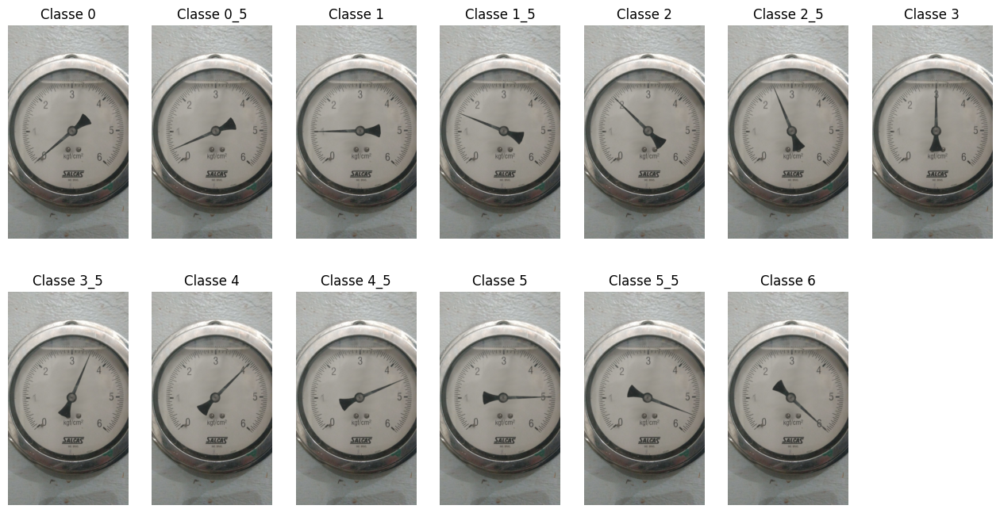

In [ ]:
# Executando a função view_random_images nesta etapa, vemos apenas a imagem 
# inicial de classe. Nas etapas posteriores, após o processo de data augmentation, 
# a função retornará exemplos aleatórios.

view_random_images("Classes", class_names)

# Data Augmentation

Apesar da versão atual do TensorFlow permitir a utilização de técnicas de data augmentation durante o treinamento, optou-se por criar as imagens em etapa anterior, além da utilização de distorções não presentes na classe ImageDataGenerator. 

In [ ]:
from PIL import Image
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.utils import array_to_img, img_to_array, load_img

# A variável fill_color define a cor de preenchimento das regiões deslocadas
# pelas transformações resultantes do processo de data augmentation. O modo
# de preenchimento adotado foi o "constant", como pode-se verificar abaixo. 
fill_color=(122,122,122)

# A vaiável n_images define o número de imagens geradas pela função
n_images = 200

# A variável noise_stddev ajusta o nível de ruído que será aplicado na imagem
noise_stddev = 0.05

# A função noisy_generator é responsável por adicionar distorções nas imagens
# aumentadas, visto que esta funcionalidade não existe na classe ImageDataGenerator
def noisy_generator(datagen, noise_stddev, save_to_dir, save_prefix, save_format):
    for x in datagen:
        # Cria uma máscara para as regiões diferentes de zero
        mask = x > 0

        # Adiciona distorção Gaussiana na imagem
        noise = np.random.normal(0, noise_stddev, x.shape) * mask
        x_noisy = np.clip(x + noise, 0, 1)

        # Salva a imagem distorcida
        if save_to_dir:
            img = array_to_img(x_noisy[0], scale=True)
            fname = f"{save_prefix}_{i}.{save_format}"
            img.save(os.path.join(save_to_dir, fname))

        yield x_noisy

# A função rgb_to_gray converte uma tupla representando um valor de cor na escala
# RGB para um valor escalar em escala de cinza que será utilizado na propriedade
# cval do ImageDataGenerator
def rgb_to_gray(rgb):
    return 0.2989 * rgb[0] + 0.5870 * rgb[1] + 0.1140 * rgb[2]

# O loop a seguir gera n imagens para cada classe em class_names, usando uma
# única imagem original. São aplicadas diversas técnicas de data augmentation 
# como rotação, deslocamento, zoom e ruído, com o objetivo de criar um conjunto 
# diversificado de imagens para cada classe.
for a in class_names:
    img_path = 'Classes/' + a + '/' + a + '.jpg'
    save_dir = 'Classes/' + a
    aug_number = n_images - 2

    datagen = ImageDataGenerator(
        rotation_range=5,
        width_shift_range=0.01,
        height_shift_range=0.01,
        shear_range=0.01,
        zoom_range=(0.85, 1.15),
        horizontal_flip=False,
        fill_mode='constant',
        cval=rgb_to_gray(fill_color),
        brightness_range=[0.1, 1.8],
        channel_shift_range=0.5,
        rescale=1.0/255.0
    )

    img = load_img(img_path)
    x = img_to_array(img)
    x = x.reshape((1,) + x.shape)

    # O comando .flow() gera batches de imagens transformadas aleatoriamente
    base_generator = datagen.flow(x, batch_size=1)

    # Aplica a distorção usando a função noisy_generator
    noisy_gen = noisy_generator(base_generator, noise_stddev, save_dir, save_prefix=a, save_format='jpeg')

    i = 0
    for batch in noisy_gen:
        i += 1
        if i > aug_number:
            break  # Previne um loop infinito

    # Reseta o gerador de imagens de modo que ele não reinicie do ponto de 
    # parada na próxima iteração
    del datagen

In [ ]:
# Verificando novamente os arquivos e diretórios

for dirpath, dirnames, filenames in os.walk("Classes"):
  print(f"Existem {len(dirnames)} diretórios e {len(filenames)} imagens na pasta '{dirpath}'")

Existem 13 diretórios e 0 imagens na pasta 'Classes'
Existem 0 diretórios e 200 imagens na pasta 'Classes/1_5'
Existem 0 diretórios e 200 imagens na pasta 'Classes/5_5'
Existem 0 diretórios e 200 imagens na pasta 'Classes/2'
Existem 0 diretórios e 200 imagens na pasta 'Classes/2_5'
Existem 0 diretórios e 200 imagens na pasta 'Classes/0_5'
Existem 0 diretórios e 200 imagens na pasta 'Classes/4_5'
Existem 0 diretórios e 200 imagens na pasta 'Classes/3'
Existem 0 diretórios e 200 imagens na pasta 'Classes/3_5'
Existem 0 diretórios e 200 imagens na pasta 'Classes/6'
Existem 0 diretórios e 200 imagens na pasta 'Classes/1'
Existem 0 diretórios e 200 imagens na pasta 'Classes/0'
Existem 0 diretórios e 200 imagens na pasta 'Classes/5'
Existem 0 diretórios e 200 imagens na pasta 'Classes/4'


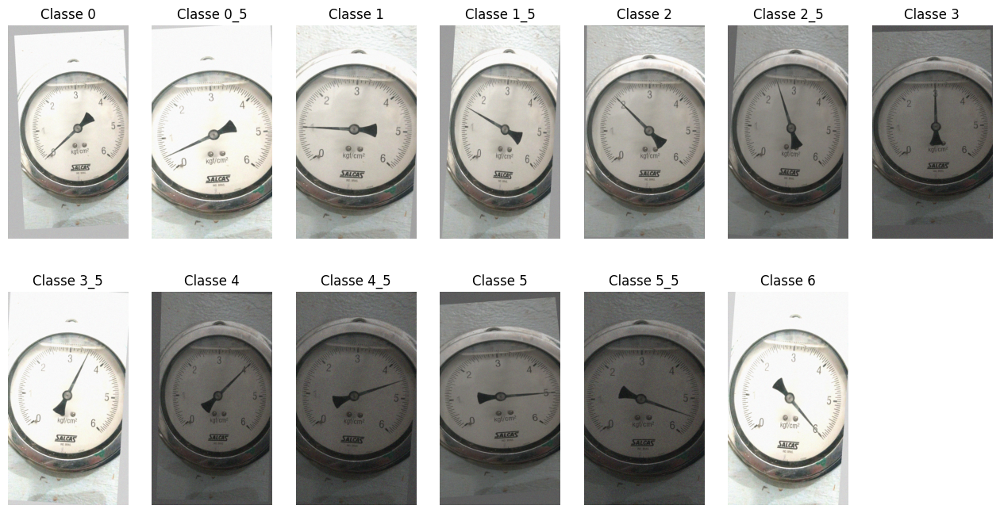

In [ ]:
# Executando a função view_random_images nesta etapa, vemos agora exemplos 
# aleatórios das novas imagens geradas.

view_random_images("Classes", class_names)

# Preparação de Dados para o Treinamento

A criação dos datasets fará uso do método flow_from_directory e dividirá as imagens em lotes definidos pelo parâmetro `batch_size`, além de realizar a divisão do conjunto em Treinamento e Validação, normalizar as imagens e alterar o formato para um tensor de 4 dimensões, compatível com a entrada da primeira camada. Os nomes das classes derivam dos nomes dos diretórios e serão transformados para o formato `one-hot-encoded` de acordo com a propriedade `class_mode` escolhida abaixo (`"categorical"`).

In [10]:
# Filtra mensagens de log de baixa severidade do TensorFlow
os.environ['TF_CPP_MIN_LOG_LEVEL'] = '2'

from PIL import Image
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.utils import array_to_img, img_to_array, load_img

In [16]:
# Gerando os datasets para treinamento

data_dir = "Classes"

train_datagen = ImageDataGenerator(rescale=1/255.,
                                   validation_split=0.2)  # Adicionado de modo que o dataset seja dividido automaticamente na proporção 80/20 - Treinamento/Validação

train_generator = train_datagen.flow_from_directory(
    data_dir,
    target_size=(400, 225),
    batch_size=32,
    class_mode='categorical',
    subset='training',  # Identificação do conjunto de treinamento
    seed=42
)

val_generator = train_datagen.flow_from_directory(
    data_dir,
    target_size=(400, 225),
    batch_size=32,
    class_mode='categorical',
    subset='validation',  # Identificação do conjunto de validação
    seed=42
)

Found 2080 images belonging to 13 classes.
Found 520 images belonging to 13 classes.


Criados os lotes e realizada a divisão, podemos inspecionar os dados já formatados:

In [5]:
# A função abaixo permite inspecionar visualmente as 32 imagens presente no lote/batch

def visualize_batch(image_batch, label_batch, class_names):
    plt.figure(figsize=(20, 20))
    for n in range(32):
        ax = plt.subplot(8, 4, n + 1)
        plt.imshow(image_batch[n])
        plt.title(class_names[np.argmax(label_batch[n])])
        plt.axis("off")

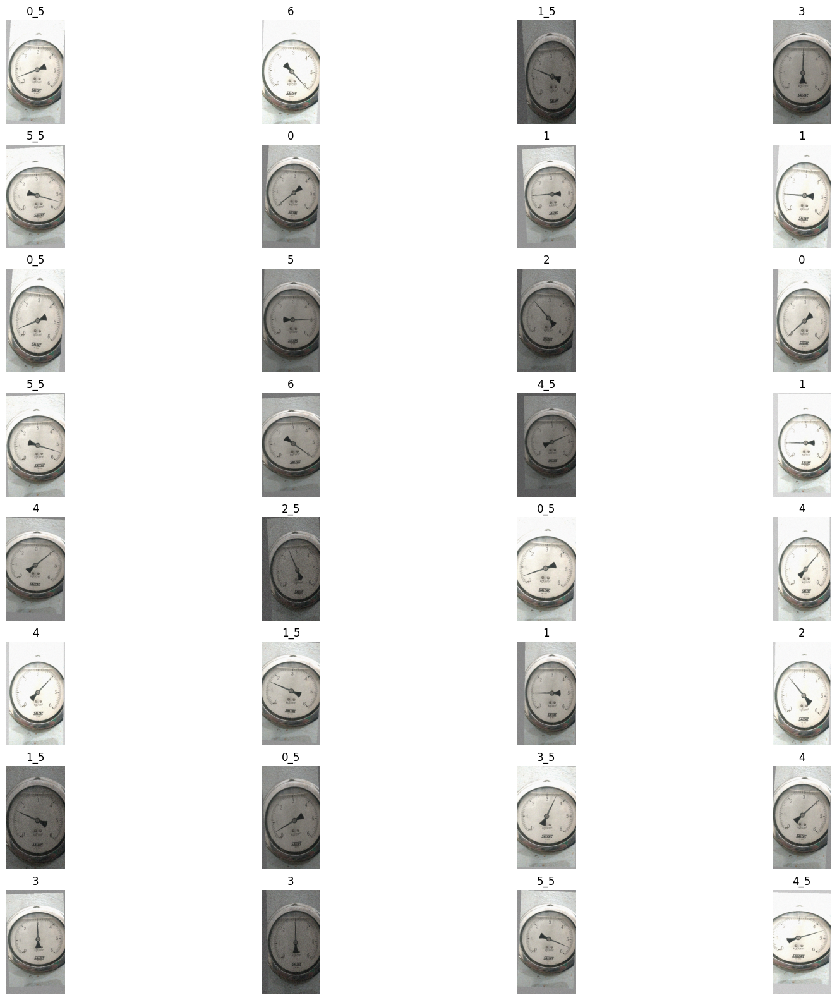

In [ ]:
# Busca um lote e chama a função de visualização

image_batch, label_batch = next(train_generator)

visualize_batch(image_batch, label_batch, class_names)

In [ ]:
# É possível verificar as labels das imagens (já no formato one-hot-encoded)

print(label_batch)

[[0. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 1.]
 [0. 0. 0. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0. 1. 0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 1. 0.]
 [1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
 [0. 0. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
 [0. 0. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
 [0. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 1. 0. 0.]
 [0. 0. 0. 0. 1. 0. 0. 0. 0. 0. 0. 0. 0.]
 [1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 1. 0.]
 [0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 1.]
 [0. 0. 0. 0. 0. 0. 0. 0. 0. 1. 0. 0. 0.]
 [0. 0. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0. 0. 0. 1. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 1. 0. 0. 0. 0. 0. 0. 0.]
 [0. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0. 0. 0. 1. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0. 0. 0. 1. 0. 0. 0. 0.]
 [0. 0. 0. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
 [0. 0. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 1. 0. 0. 0. 0. 0. 0.

In [ ]:
# E também o formato (tensor de 4 dimensões)

print(image_batch)

[[[[0.73333335 0.7411765  0.7372549 ]
   [0.7490196  0.7568628  0.75294125]
   [0.7490196  0.7568628  0.75294125]
   ...
   [0.9921569  0.9921569  0.9921569 ]
   [0.9803922  0.9803922  0.9803922 ]
   [0.9921569  0.9803922  1.        ]]

  [[0.7411765  0.7411765  0.7411765 ]
   [0.73333335 0.73333335 0.73333335]
   [0.7176471  0.7176471  0.7176471 ]
   ...
   [0.9568628  0.9568628  0.9568628 ]
   [0.9960785  0.9960785  0.9960785 ]
   [1.         0.9921569  0.98823535]]

  [[0.7960785  0.78823537 0.79215693]
   [0.7607844  0.75294125 0.7568628 ]
   [0.6901961  0.68235296 0.6862745 ]
   ...
   [0.9843138  0.9843138  0.9843138 ]
   [0.96470594 0.96470594 0.96470594]
   [0.9843138  0.9803922  0.96470594]]

  ...

  [[0.7137255  0.70980394 0.6901961 ]
   [0.74509805 0.75294125 0.73333335]
   [0.7294118  0.7294118  0.72156864]
   ...
   [0.77647066 0.8000001  0.8000001 ]
   [0.7411765  0.75294125 0.7803922 ]
   [0.72156864 0.7254902  0.74509805]]

  [[0.7607844  0.7686275  0.7490196 ]
   [0.7

# Criação do Modelo

O modelo escolhido consiste de uma Rede Neural Convolucional, dadas as vantagens, robustez e performance destas em problemas de reconhecimento e classificação de imagens. Adotaram-se as funções `relu` para ativação das camadas e entropia cruzada categórica (`categorical_cross_entropy`) para a perda. A métrica utilizada será a acurácia (`accuracy`).

In [11]:
# Criação do modelo utilizando a API Sequential do Keras

from tensorflow.keras.optimizers import Adam
from tensorflow.keras.layers import Dense, Flatten, Conv2D, MaxPool2D, Activation
from tensorflow.keras import Sequential

base_model = Sequential([
    Conv2D(32, 3, activation="relu", input_shape=(400, 225, 3)),
    MaxPool2D(),
    Conv2D(64, 3, activation="relu"),
    MaxPool2D(),
    Conv2D(128, 3, activation="relu"),
    MaxPool2D(),
    Flatten(),
    Dense(256, activation="relu"),
    Dense(13, activation="softmax")
])

In [11]:
# É possível verificar o número de parâmetros e a distribuição de camadas através
# de um sumário do modelo criado

base_model.summary()

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d (Conv2D)             (None, 398, 223, 32)      896       
                                                                 
 max_pooling2d (MaxPooling2D  (None, 199, 111, 32)     0         
 )                                                               
                                                                 
 conv2d_1 (Conv2D)           (None, 197, 109, 64)      18496     
                                                                 
 max_pooling2d_1 (MaxPooling  (None, 98, 54, 64)       0         
 2D)                                                             
                                                                 
 conv2d_2 (Conv2D)           (None, 96, 52, 128)       73856     
                                                                 
 max_pooling2d_2 (MaxPooling  (None, 48, 26, 128)      0

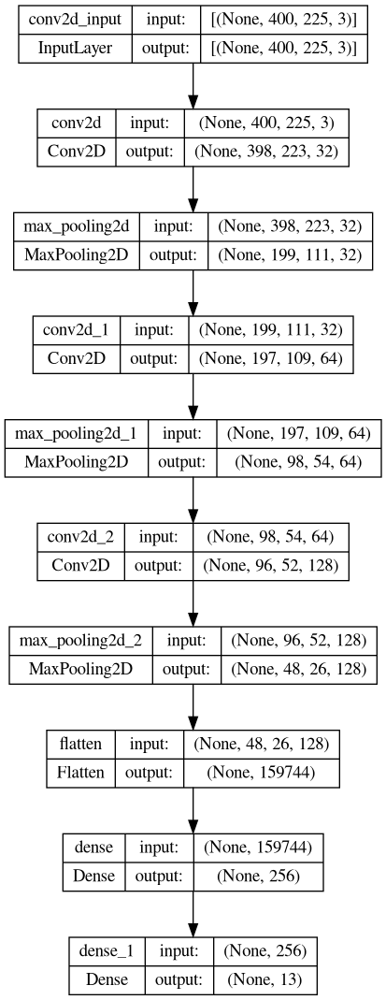

In [ ]:
# Também é possível plotar graficamente o modelo e verificar os formatos de entrada
# e saída de cada camada

from tensorflow.keras.utils import plot_model
from IPython.display import Image

plot_model(base_model, to_file='model_plot.png', show_shapes=True, show_layer_names=True)

Image(filename='model_plot.png')

Este modelo foi projetado para classificar imagens em 13 classes diferentes, usando uma combinação de camadas convolucionais e totalmente conectadas. As camadas convolucionais ajudam a aprender características locais, enquanto as camadas totalmente conectadas aprendem a representação global e realizam a classificação final.

In [18]:
# Compilando o modelo

base_model.compile(loss="categorical_crossentropy",
              optimizer=Adam(),
              metrics=["accuracy"])

In [63]:
#Checando a disponibilidade e modelo da GPU alocada

!nvidia-smi

/usr/bin/zsh: /home/junior/miniconda3/envs/tf/lib/libncursesw.so.6: no version information available (required by /usr/bin/zsh)
Fri Apr 21 09:36:00 2023       
+---------------------------------------------------------------------------------------+
| NVIDIA-SMI 530.41.03              Driver Version: 530.41.03    CUDA Version: 12.1     |
|-----------------------------------------+----------------------+----------------------+
| GPU  Name                  Persistence-M| Bus-Id        Disp.A | Volatile Uncorr. ECC |
| Fan  Temp  Perf            Pwr:Usage/Cap|         Memory-Usage | GPU-Util  Compute M. |
|                                         |                      |               MIG M. |
|=========================================+======================+======================|
|   0  NVIDIA GeForce RTX 3080 Ti      Off| 00000000:2B:00.0  On |                  N/A |
| 47%   56C    P2              115W / 350W|  10792MiB / 12288MiB |      1%      Default |
|                             

# Treinando o Modelo

In [19]:
# O método fit é utilizado para treinar o modelo e retorna um objeto History 
# que contém a perda de treinamento e os valores das métricas para cada época

history = base_model.fit(train_generator,
                    epochs=5,
                    steps_per_epoch=len(train_generator),
                    validation_data=val_generator,
                    validation_steps=len(val_generator))

Epoch 1/5


2023-04-21 15:31:39.242361: I tensorflow/stream_executor/cuda/cuda_dnn.cc:384] Loaded cuDNN version 8600
2023-04-21 15:31:40.226553: I tensorflow/stream_executor/cuda/cuda_blas.cc:1614] TensorFloat-32 will be used for the matrix multiplication. This will only be logged once.


65/65 [==============================] - 22s 299ms/step - loss: 2.8024 - accuracy: 0.1620 - val_loss: 2.1540 - val_accuracy: 0.3308
Epoch 2/5
65/65 [==============================] - 18s 274ms/step - loss: 1.0351 - accuracy: 0.6625 - val_loss: 0.5608 - val_accuracy: 0.8154
Epoch 3/5
65/65 [==============================] - 18s 280ms/step - loss: 0.2796 - accuracy: 0.9087 - val_loss: 0.4308 - val_accuracy: 0.8385
Epoch 4/5
65/65 [==============================] - 17s 268ms/step - loss: 0.0988 - accuracy: 0.9769 - val_loss: 0.2397 - val_accuracy: 0.9346
Epoch 5/5
65/65 [==============================] - 18s 270ms/step - loss: 0.0275 - accuracy: 0.9947 - val_loss: 0.2045 - val_accuracy: 0.9538


# Visualizando e Interpretando os Resultados

In [ ]:
# Verificando o objeto history

print(history)
print(history.history)

{'loss': [2.8431148529052734, 2.21931791305542, 0.8293821215629578, 0.2571513056755066, 0.09238097816705704], 'accuracy': [0.11153846234083176, 0.33173078298568726, 0.7240384817123413, 0.9254807829856873, 0.9721153974533081], 'val_loss': [2.5625243186950684, 1.3339152336120605, 0.5391220450401306, 0.2903868854045868, 0.3117400109767914], 'val_accuracy': [0.19423076510429382, 0.5788461565971375, 0.7942307591438293, 0.9076923131942749, 0.9192307591438293]}


In [12]:
# Criando uma função que plota as curvas das funções de perda e métricas

def plot_loss_curves(history):
  """
  Retorna a plotagem das curvas de treinamento e validação do objeto History de um modelo.
  """
  loss = history.history["loss"]
  val_loss = history.history["val_loss"]

  accuracy = history.history["accuracy"]
  val_accuracy = history.history["val_accuracy"]

  epochs = range(len(history.history["loss"]))

  # Plota a perda
  plt.plot(epochs, loss, label="perda_treinamento")
  plt.plot(epochs, val_loss, label="perda_validação")
  plt.title("Perda")
  plt.xlabel("Épocas")
  plt.legend()

  # Plota a acurácia
  plt.figure()
  plt.plot(epochs, accuracy, label="acurácia_treinamento")
  plt.plot(epochs, val_accuracy, label="acurácia_validação")
  plt.title("Acurácia")
  plt.xlabel("Épocas")
  plt.legend()

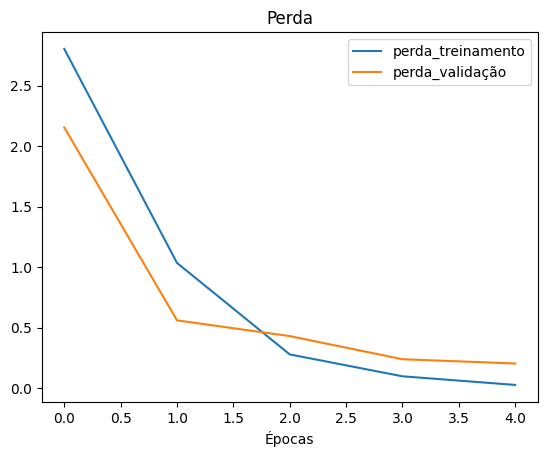

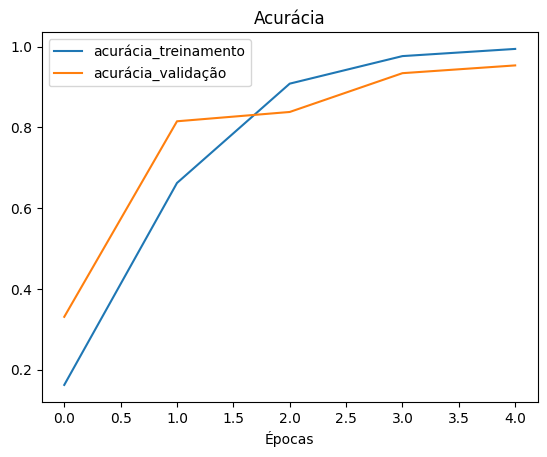

In [21]:
plot_loss_curves(history)

Com base nos resultados, constata-se que o modelo está aprendendo e generalizando bem no conjunto de dados de validação. Não há sinal claro de over ou underfitting, visto que as acurácias de treinamento e validação são altas e as perdas baixas.

# Avaliação do Modelo

In [ ]:
# Obtendo um conjunto de imagens de teste, não utilizadas no treinamento

!wget --no-check-certificate 'https://drive.google.com/uc?export=download&id=11YU-dsnKPuv9yCANmsuU2gwaWhBgvwGZ&confirm=t&uuid=e8156c2f-bbde-4237-8614-f5ac4f8d4061&at=ANzk5s41F7y5W6OZssH1GyPIRKPf:1681510401137' -O "Test_Classes.zip"

/usr/bin/zsh: /home/junior/miniconda3/envs/tf/lib/libncursesw.so.6: no version information available (required by /usr/bin/zsh)
--2023-04-19 19:25:54--  https://drive.google.com/uc?export=download&id=11YU-dsnKPuv9yCANmsuU2gwaWhBgvwGZ&confirm=t&uuid=e8156c2f-bbde-4237-8614-f5ac4f8d4061&at=ANzk5s41F7y5W6OZssH1GyPIRKPf:1681510401137
Loaded CA certificate '/etc/ssl/certs/ca-certificates.crt'
Resolving drive.google.com (drive.google.com)... 2800:3f0:4001:82f::200e, 142.251.129.142
Connecting to drive.google.com (drive.google.com)|2800:3f0:4001:82f::200e|:443... connected.
HTTP request sent, awaiting response... 303 See Other
Location: https://doc-04-3g-docs.googleusercontent.com/docs/securesc/ha0ro937gcuc7l7deffksulhg5h7mbp1/f0e1aso97juoggk1da6jongedsc4ke1j/1681943100000/10712319952389096693/*/11YU-dsnKPuv9yCANmsuU2gwaWhBgvwGZ?e=download&uuid=e8156c2f-bbde-4237-8614-f5ac4f8d4061 [following]
--2023-04-19 19:25:54--  https://doc-04-3g-docs.googleusercontent.com/docs/securesc/ha0ro937gcuc7l7de

In [ ]:
# Descompactando o arquivo
import zipfile

zip_ref = zipfile.ZipFile("Test_Classes.zip")
zip_ref.extractall()
zip_ref.close()

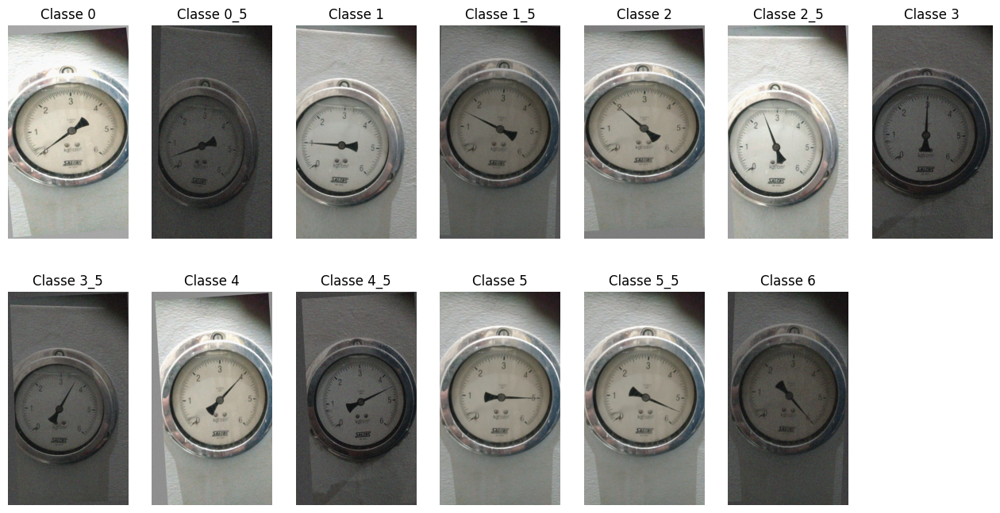

In [ ]:
# Executando a função view_random_images nesta etapa, vemos agora exemplos 
# aleatórios das novas imagens geradas.

view_random_images("Test_Classes", class_names)

In [22]:
# Criando um dataset de teste

test_data_dir = "Test_Classes"

test_datagen = ImageDataGenerator(rescale=1/255.)

test_generator = test_datagen.flow_from_directory(
    test_data_dir,
    target_size=(400, 225),
    batch_size=32,
    class_mode='categorical',
    shuffle=False
)

Found 469 images belonging to 13 classes.


In [ ]:
# Verificando novamente os arquivos e diretórios

for dirpath, dirnames, filenames in os.walk("Test_Classes"):
  print(f"Existem {len(dirnames)} diretórios e {len(filenames)} imagens na pasta '{dirpath}'")

Existem 13 diretórios e 0 imagens na pasta 'Test_Classes'
Existem 0 diretórios e 36 imagens na pasta 'Test_Classes/1_5'
Existem 0 diretórios e 36 imagens na pasta 'Test_Classes/5_5'
Existem 0 diretórios e 36 imagens na pasta 'Test_Classes/2'
Existem 0 diretórios e 36 imagens na pasta 'Test_Classes/2_5'
Existem 0 diretórios e 36 imagens na pasta 'Test_Classes/0_5'
Existem 0 diretórios e 36 imagens na pasta 'Test_Classes/4_5'
Existem 0 diretórios e 36 imagens na pasta 'Test_Classes/3'
Existem 0 diretórios e 37 imagens na pasta 'Test_Classes/3_5'
Existem 0 diretórios e 36 imagens na pasta 'Test_Classes/6'
Existem 0 diretórios e 36 imagens na pasta 'Test_Classes/1'
Existem 0 diretórios e 36 imagens na pasta 'Test_Classes/0'
Existem 0 diretórios e 36 imagens na pasta 'Test_Classes/5'
Existem 0 diretórios e 36 imagens na pasta 'Test_Classes/4'


In [23]:
# Avaliando o modelo nos novos dados

test_loss, test_accuracy = base_model.evaluate(test_generator)

print("Perda do Conjunto de Testes:", test_loss)
print("Acurácia do Conjunto de Testes:", test_accuracy)

15/15 [==============================] - 3s 212ms/step - loss: 11.7727 - accuracy: 0.2601
Perda do Conjunto de Testes: 11.772700309753418
Acurácia do Conjunto de Testes: 0.2601279318332672


Os resultados indicam um possível problema de overfitting no modelo. Verifica-se discrepância significativa entre o desempenho no conjunto de validação e no conjunto de testes. No conjunto de validação, o modelo obteve acurácia de 0,9615 e a perda da ordem de 0,1052, após 5 épocas de treinamento. O cenário foi diferente, entretanto, nos dados inéditos de teste. A acurácia de 0,2308 e a perda significativa de 9,6622 sugerem que o modelo provavelmente aprendeu muito bem os dados de treinamento e seu ruído inerente, resultando em uma capacidade reduzida de generalização.

Usualmente, várias abordagens podem ser exploradas para mitigação do overfitting, como refinamento da arquitetura do modelo, implementação de técnicas de regularização ou ajuste de hiperparâmetros de treinamento. Contudo, a causa mais provavel no presente caso deve-se a falta de diversidade nos dados do conjunto.

# Adequações e Experimentação

## Obtendo novos dados

Obtiveram-se três novas imagens do mesmo equipamento, nomeadas com os seguintes sufixos `_a`, `_b` e `_c`. Todas passaram pela mesma manipulação digital da imagem original. Adotou-se a seguinte divisão dos dados:

- **Conjunto de Treinamento:** Imagem original + sufixo `_a`;
- **Conjunto de Validação:** Sufixo `_b`;
- **Conjunto de Testes:** Sufixo `_c`;

O script de Data Augmentation foi melhorado para se adequar aos novos dados. Serão geradas 500 imagens no conjunto de treinamento (250 de cada fonte) e 150 imagens para os demais conjuntos.

In [ ]:
#Download do dataset
#Visualização

**Novas Imagens**

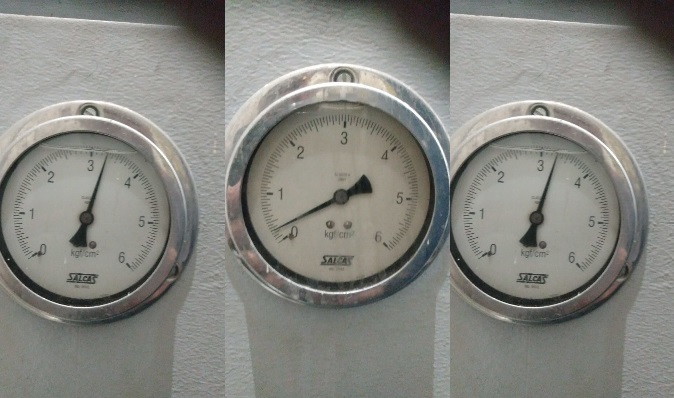

In [ ]:
# Verificando novamente os arquivos e diretórios

for dirpath, dirnames, filenames in os.walk("Classes_2"):
  print(f"Existem {len(dirnames)} diretórios e {len(filenames)} imagens na pasta '{dirpath}'")

Existem 3 diretórios e 0 imagens na pasta 'Classes_2'
Existem 13 diretórios e 0 imagens na pasta 'Classes_2/validation'
Existem 0 diretórios e 150 imagens na pasta 'Classes_2/validation/1_5'
Existem 0 diretórios e 150 imagens na pasta 'Classes_2/validation/5_5'
Existem 0 diretórios e 150 imagens na pasta 'Classes_2/validation/2'
Existem 0 diretórios e 150 imagens na pasta 'Classes_2/validation/2_5'
Existem 0 diretórios e 150 imagens na pasta 'Classes_2/validation/0_5'
Existem 0 diretórios e 150 imagens na pasta 'Classes_2/validation/4_5'
Existem 0 diretórios e 150 imagens na pasta 'Classes_2/validation/3'
Existem 0 diretórios e 150 imagens na pasta 'Classes_2/validation/3_5'
Existem 0 diretórios e 150 imagens na pasta 'Classes_2/validation/6'
Existem 0 diretórios e 150 imagens na pasta 'Classes_2/validation/1'
Existem 0 diretórios e 150 imagens na pasta 'Classes_2/validation/0'
Existem 0 diretórios e 150 imagens na pasta 'Classes_2/validation/5'
Existem 0 diretórios e 150 imagens na pa

## Data Agumentation

In [ ]:
#Melhorado
import os
import numpy as np
from PIL import Image
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.utils import array_to_img, img_to_array, load_img

fill_color = (122, 122, 122)
noise_stddev = 0.05

def noisy_generator(datagen, noise_stddev, save_to_dir, save_prefix, save_format, i):
    for x in datagen:
        mask = x > 0
        noise = np.random.normal(0, noise_stddev, x.shape) * mask
        x_noisy = np.clip(x + noise, 0, 1)

        if save_to_dir:
            img = array_to_img(x_noisy[0], scale=True)
            fname = f"{save_prefix}_{i[0]}.{save_format}"
            img.save(os.path.join(save_to_dir, fname))

        i[0] += 1
        yield x_noisy

def rgb_to_gray(rgb):
    return 0.2989 * rgb[0] + 0.5870 * rgb[1] + 0.1140 * rgb[2]

def generate_augmented_images(img_path, save_dir, aug_number, save_prefix):
    datagen = ImageDataGenerator(
        rotation_range=5,
        width_shift_range=0.01,
        height_shift_range=0.01,
        shear_range=0.01,
        zoom_range=(0.85, 1.15),
        horizontal_flip=False,
        fill_mode='constant',
        cval=rgb_to_gray(fill_color),
        brightness_range=[0.1, 1.8],
        channel_shift_range=0.5,
        rescale=1.0 / 255.0
    )

    img = load_img(img_path)
    x = img_to_array(img)
    x = x.reshape((1,) + x.shape)

    base_generator = datagen.flow(x, batch_size=1)
    i = [0]
    noisy_gen = noisy_generator(base_generator, noise_stddev, save_dir, save_prefix=save_prefix, save_format='jpeg', i=i)

    for batch in noisy_gen:
        if i[0] > aug_number:
            break

    del datagen

datasets = ['training', 'validation', 'test']
suffixes = {'training': ['', '_a'], 'validation': ['_b'], 'test': ['_c']}
images_to_generate = {'training': 250, 'validation': 150, 'test': 150}

for dataset in datasets:
    for class_name in class_names:
        for suffix in suffixes[dataset]:
            img_path = f'Classes_2/{dataset}/{class_name}/{class_name}{suffix}.jpg'
            save_dir = f'Classes_2/{dataset}/{class_name}'
            aug_number = images_to_generate[dataset] - 2
            generate_augmented_images(img_path, save_dir, aug_number, save_prefix=f"{class_name}{suffix}")

In [ ]:
# Verificando o número de imagens geradas

for dirpath, dirnames, filenames in os.walk("Classes_2"):
  print(f"Existem {len(dirnames)} diretórios e {len(filenames)} imagens na pasta '{dirpath}'")

Existem 3 diretórios e 0 imagens na pasta 'Classes_2'
Existem 13 diretórios e 0 imagens na pasta 'Classes_2/validation'
Existem 0 diretórios e 150 imagens na pasta 'Classes_2/validation/1_5'
Existem 0 diretórios e 150 imagens na pasta 'Classes_2/validation/5_5'
Existem 0 diretórios e 150 imagens na pasta 'Classes_2/validation/2'
Existem 0 diretórios e 150 imagens na pasta 'Classes_2/validation/2_5'
Existem 0 diretórios e 150 imagens na pasta 'Classes_2/validation/0_5'
Existem 0 diretórios e 150 imagens na pasta 'Classes_2/validation/4_5'
Existem 0 diretórios e 150 imagens na pasta 'Classes_2/validation/3'
Existem 0 diretórios e 150 imagens na pasta 'Classes_2/validation/3_5'
Existem 0 diretórios e 150 imagens na pasta 'Classes_2/validation/6'
Existem 0 diretórios e 150 imagens na pasta 'Classes_2/validation/1'
Existem 0 diretórios e 150 imagens na pasta 'Classes_2/validation/0'
Existem 0 diretórios e 150 imagens na pasta 'Classes_2/validation/5'
Existem 0 diretórios e 150 imagens na pa

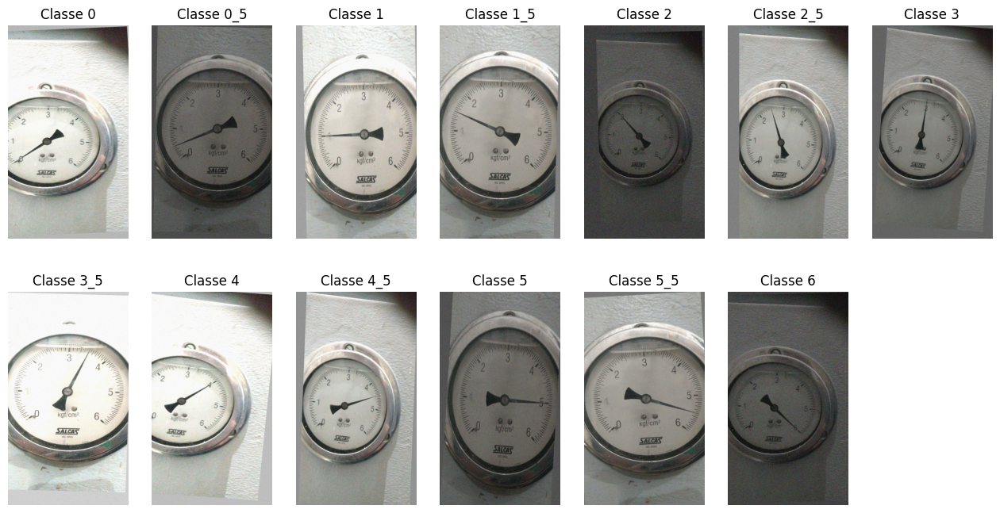

In [ ]:
# Visualizando o conjunto de treinamento

view_random_images("Classes_2/training", class_names)

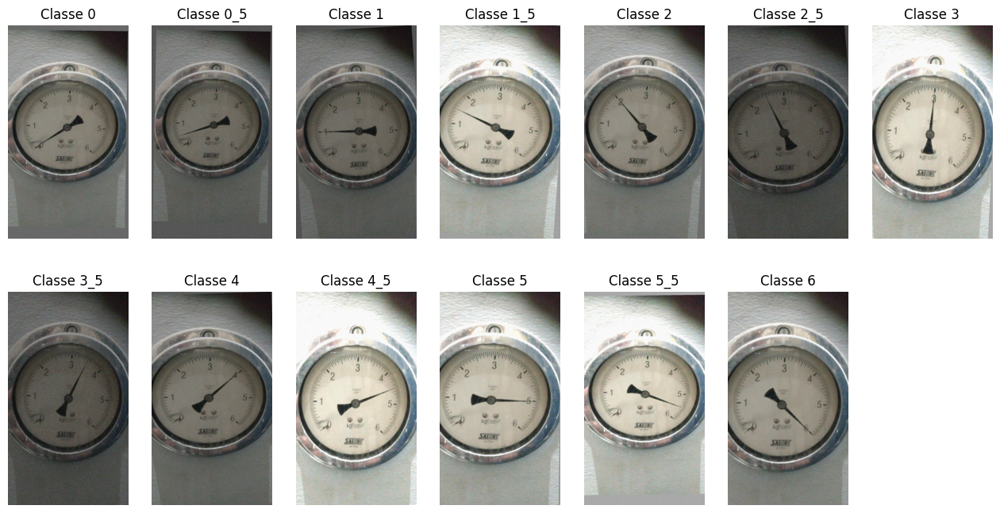

In [ ]:
# Visualizando o conjunto de validação

view_random_images("Classes_2/validation", class_names)

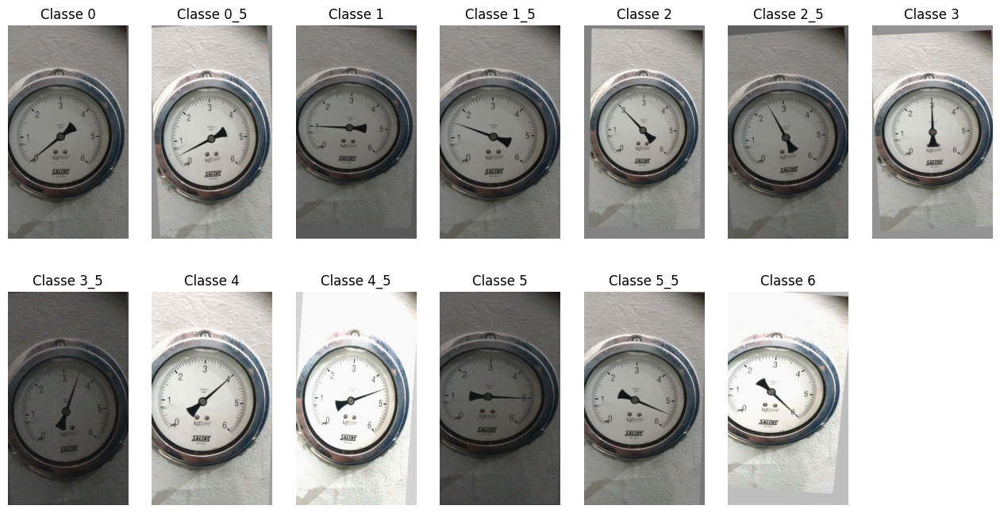

In [ ]:
# Visualizando o conjunto de testes

view_random_images("Classes_2/test", class_names)

## Preparação dos Dados para Treinamento

In [13]:
# Gerando os datasets para treinamento

data_dir = "Classes_2"

train_datagen = ImageDataGenerator(rescale=1/255.)

train_generator = train_datagen.flow_from_directory(
    "Classes_2/training",
    target_size=(400, 225),
    batch_size=32,
    class_mode='categorical',
    seed=42
)

val_generator = train_datagen.flow_from_directory(
    "Classes_2/validation",
    target_size=(400, 225),
    batch_size=32,
    class_mode='categorical',
    seed=42
)

Found 6500 images belonging to 13 classes.
Found 1950 images belonging to 13 classes.


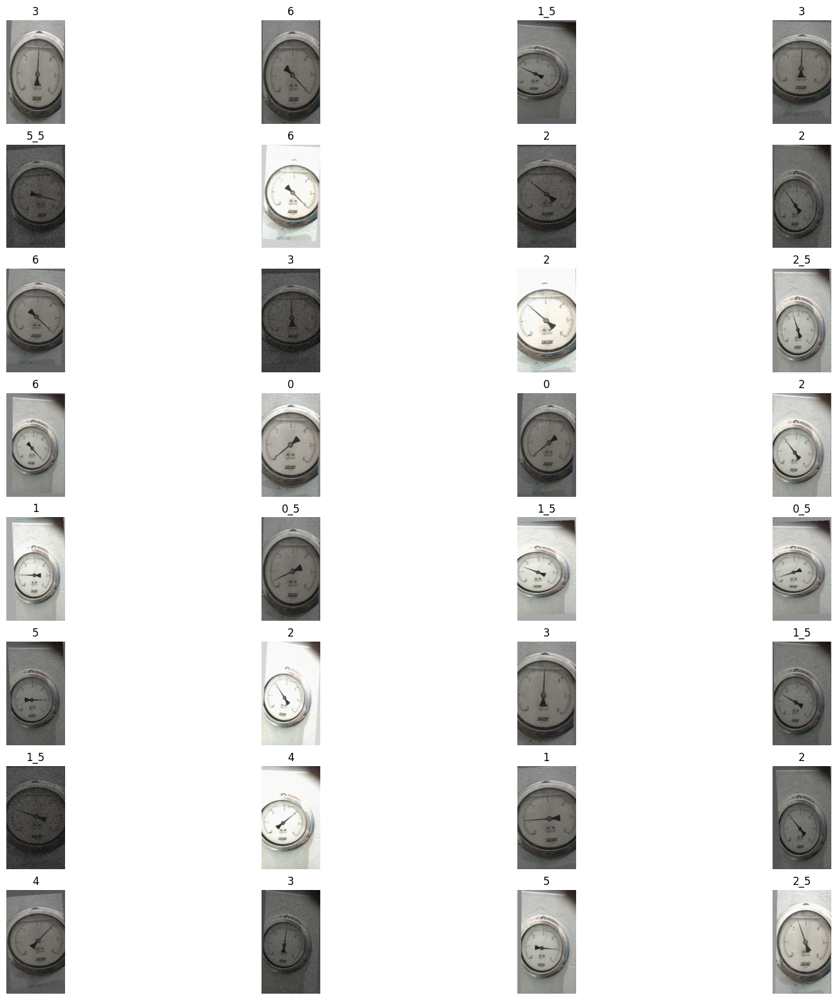

In [ ]:
# Busca um lote e chama a função de visualização

image_batch, label_batch = next(train_generator)

visualize_batch(image_batch, label_batch, class_names)

## Treinamento nos Novos Datasets

In [25]:
# Compilando o modelo

base_model.compile(loss="categorical_crossentropy",
              optimizer=Adam(),
              metrics=["accuracy"])

# Treinando o modelo

history = base_model.fit(train_generator,
                    epochs=10,
                    steps_per_epoch=len(train_generator),
                    validation_data=val_generator,
                    validation_steps=len(val_generator))

Epoch 1/10
204/204 [==============================] - 61s 298ms/step - loss: 1.8402 - accuracy: 0.4151 - val_loss: 1.8418 - val_accuracy: 0.4805
Epoch 2/10
204/204 [==============================] - 57s 281ms/step - loss: 0.3723 - accuracy: 0.8852 - val_loss: 3.8058 - val_accuracy: 0.4646
Epoch 3/10
204/204 [==============================] - 57s 278ms/step - loss: 0.0990 - accuracy: 0.9725 - val_loss: 5.4134 - val_accuracy: 0.4764
Epoch 4/10
204/204 [==============================] - 56s 277ms/step - loss: 0.0631 - accuracy: 0.9832 - val_loss: 6.9147 - val_accuracy: 0.4774
Epoch 5/10
204/204 [==============================] - 59s 289ms/step - loss: 0.0394 - accuracy: 0.9903 - val_loss: 7.6372 - val_accuracy: 0.5231
Epoch 6/10
204/204 [==============================] - 58s 285ms/step - loss: 0.0276 - accuracy: 0.9920 - val_loss: 7.2647 - val_accuracy: 0.4995
Epoch 7/10
204/204 [==============================] - 57s 278ms/step - loss: 0.0318 - accuracy: 0.9918 - val_loss: 7.0343 - val_ac

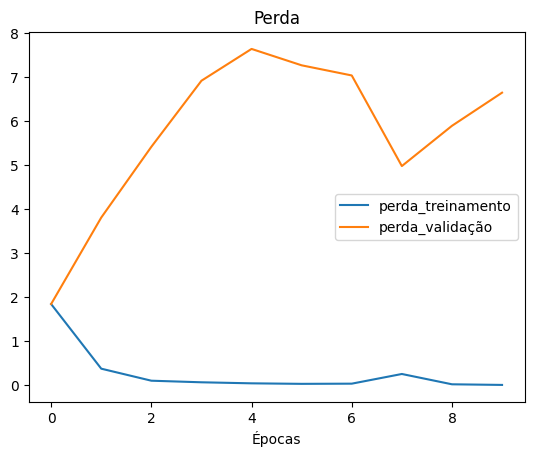

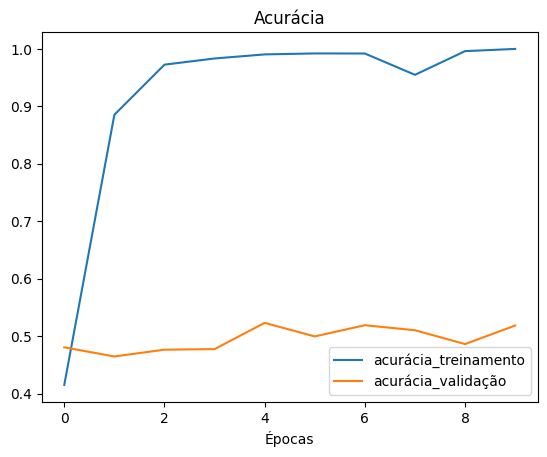

In [26]:
plot_loss_curves(history)

Observa-se que a introdução de novos dados nos conjuntos resultou em valores mais realistas para a acurácia e perda do conjunto de validação. O overfitting fica agora mais visível.

## Revisando a Arquitetura do Modelo

### Experimento 1 - Reduzindo a Complexidade do Modelo

In [27]:
# Partindo-se do modelo inicial, reduz-se a complexididade deste através da
# eliminação de determinadas camadas

model_1 = Sequential([
    Conv2D(32, 3, activation="relu", input_shape=(400, 225, 3)),
    MaxPool2D(),
    Conv2D(64, 3, activation="relu"),
    MaxPool2D(),
    Flatten(),
    Dense(13, activation="softmax")
])

In [28]:
model_1.summary()

Model: "sequential_4"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d_12 (Conv2D)          (None, 398, 223, 32)      896       
                                                                 
 max_pooling2d_12 (MaxPoolin  (None, 199, 111, 32)     0         
 g2D)                                                            
                                                                 
 conv2d_13 (Conv2D)          (None, 197, 109, 64)      18496     
                                                                 
 max_pooling2d_13 (MaxPoolin  (None, 98, 54, 64)       0         
 g2D)                                                            
                                                                 
 flatten_4 (Flatten)         (None, 338688)            0         
                                                                 
 dense_8 (Dense)             (None, 13)               

O menor número de camadas resultou num número muito menor de parâmetros. O modelo original possuia 40.991.309 contra 4.422.349 do modelo atual.

In [28]:
# Compilando o modelo

model_1.compile(loss="categorical_crossentropy",
              optimizer=Adam(),
              metrics=["accuracy"])

# Treinando o modelo

history_1 = model_1.fit(train_generator,
                        epochs=10,
                        steps_per_epoch=len(train_generator),
                        validation_data=val_generator,
                        validation_steps=len(val_generator))

Epoch 1/10
204/204 [==============================] - 56s 273ms/step - loss: 2.7000 - accuracy: 0.1560 - val_loss: 2.1429 - val_accuracy: 0.3723
Epoch 2/10
204/204 [==============================] - 55s 270ms/step - loss: 1.3078 - accuracy: 0.6071 - val_loss: 1.3834 - val_accuracy: 0.5682
Epoch 3/10
204/204 [==============================] - 56s 274ms/step - loss: 0.3598 - accuracy: 0.9029 - val_loss: 1.5102 - val_accuracy: 0.5600
Epoch 4/10
204/204 [==============================] - 56s 275ms/step - loss: 0.0937 - accuracy: 0.9791 - val_loss: 1.9408 - val_accuracy: 0.5538
Epoch 5/10
204/204 [==============================] - 55s 269ms/step - loss: 0.0424 - accuracy: 0.9909 - val_loss: 1.9685 - val_accuracy: 0.5528
Epoch 6/10
204/204 [==============================] - 56s 272ms/step - loss: 0.0161 - accuracy: 0.9974 - val_loss: 2.1698 - val_accuracy: 0.5605
Epoch 7/10
204/204 [==============================] - 56s 275ms/step - loss: 0.0048 - accuracy: 0.9997 - val_loss: 2.4694 - val_ac

Constata-se que o modelo ainda sofre com o overfitting. A próxima alternativa à ser explorada consiste na alteração da arquitetura do modelo.

### Experimento 2 - Definindo-se uma Nova Arquitetura Base

In [29]:
# Experimento com arquitetura distinta

model_2 = Sequential([
    Conv2D(2, 2, activation="relu", input_shape=(400, 225, 3)),
    MaxPool2D(),
    Conv2D(4, 2, activation="relu"),
    MaxPool2D(),
    Conv2D(8, 2, activation="relu"),
    MaxPool2D(),
    Conv2D(16, 2, activation="relu"),
    MaxPool2D(),
    Conv2D(32, 2, activation="relu"),
    MaxPool2D(),
    Conv2D(64, 2, activation="relu"),
    MaxPool2D(),
    Conv2D(128, 2, activation="relu"),
    Flatten(),
    Dense(13, activation="softmax")
])

In [34]:
model_2.summary()

Model: "sequential_6"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d_21 (Conv2D)          (None, 399, 224, 2)       26        
                                                                 
 max_pooling2d_20 (MaxPoolin  (None, 199, 112, 2)      0         
 g2D)                                                            
                                                                 
 conv2d_22 (Conv2D)          (None, 198, 111, 4)       36        
                                                                 
 max_pooling2d_21 (MaxPoolin  (None, 99, 55, 4)        0         
 g2D)                                                            
                                                                 
 conv2d_23 (Conv2D)          (None, 98, 54, 8)         136       
                                                                 
 max_pooling2d_22 (MaxPoolin  (None, 49, 27, 8)       

In [30]:
# Compilando o modelo

model_2.compile(loss="categorical_crossentropy",
              optimizer=Adam(),
              metrics=["accuracy"])

# Treinando o modelo

history_2 = model_2.fit(train_generator,
                        epochs=10,
                        steps_per_epoch=len(train_generator),
                        validation_data=val_generator,
                        validation_steps=len(val_generator))

Epoch 1/10
204/204 [==============================] - 48s 235ms/step - loss: 2.4545 - accuracy: 0.1271 - val_loss: 2.2734 - val_accuracy: 0.2733
Epoch 2/10
204/204 [==============================] - 47s 233ms/step - loss: 0.8707 - accuracy: 0.6829 - val_loss: 2.4723 - val_accuracy: 0.4810
Epoch 3/10
204/204 [==============================] - 47s 232ms/step - loss: 0.2766 - accuracy: 0.9025 - val_loss: 2.8381 - val_accuracy: 0.5231
Epoch 4/10
204/204 [==============================] - 48s 237ms/step - loss: 0.1296 - accuracy: 0.9585 - val_loss: 3.0291 - val_accuracy: 0.5087
Epoch 5/10
204/204 [==============================] - 46s 228ms/step - loss: 0.0841 - accuracy: 0.9711 - val_loss: 4.0911 - val_accuracy: 0.5559
Epoch 6/10
204/204 [==============================] - 47s 233ms/step - loss: 0.0646 - accuracy: 0.9788 - val_loss: 4.3172 - val_accuracy: 0.5318
Epoch 7/10
204/204 [==============================] - 48s 236ms/step - loss: 0.0650 - accuracy: 0.9774 - val_loss: 4.8364 - val_ac

De maneira contraintuitiva, verifica-se que apesar o maior número de camadas, o modelo 2 apresenta um número significativamente menor de parâmetros. Isto se deve principalmente ao efeito das camadas MaxPool2D e do número inicial de filtros reduzido. Em termos de performance, observa-se um salto significativo em relação aos modelos anteriores na acurácia do conjunto de validação, contudo, ajustes finos adicionais são necessários.

### Experimento 3 - Reduzindo a Complexidade da Nova Arquitetura

In [38]:
# Neste experimento, eliminou-se a última camada convolucional contendo 128 filtros

model_3 = Sequential([
    Conv2D(2, 2, activation="relu", input_shape=(400, 225, 3)),
    MaxPool2D(),
    Conv2D(4, 2, activation="relu"),
    MaxPool2D(),
    Conv2D(8, 2, activation="relu"),
    MaxPool2D(),
    Conv2D(16, 2, activation="relu"),
    MaxPool2D(),
    Conv2D(32, 2, activation="relu"),
    MaxPool2D(),
    Conv2D(64, 2, activation="relu"),
    MaxPool2D(),
    Flatten(),
    Dense(13, activation="softmax")
])

In [37]:
model_3.summary()

Model: "sequential_7"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d_28 (Conv2D)          (None, 399, 224, 2)       26        
                                                                 
 max_pooling2d_26 (MaxPoolin  (None, 199, 112, 2)      0         
 g2D)                                                            
                                                                 
 conv2d_29 (Conv2D)          (None, 198, 111, 4)       36        
                                                                 
 max_pooling2d_27 (MaxPoolin  (None, 99, 55, 4)        0         
 g2D)                                                            
                                                                 
 conv2d_30 (Conv2D)          (None, 98, 54, 8)         136       
                                                                 
 max_pooling2d_28 (MaxPoolin  (None, 49, 27, 8)       

In [39]:
# Compilando o modelo

model_3.compile(loss="categorical_crossentropy",
              optimizer=Adam(),
              metrics=["accuracy"])

# Treinando o modelo

history_3 = model_3.fit(train_generator,
                        epochs=10,
                        steps_per_epoch=len(train_generator),
                        validation_data=val_generator,
                        validation_steps=len(val_generator))

Epoch 1/10
204/204 [==============================] - 48s 235ms/step - loss: 2.0017 - accuracy: 0.3008 - val_loss: 1.2962 - val_accuracy: 0.5564
Epoch 2/10
204/204 [==============================] - 47s 232ms/step - loss: 0.4370 - accuracy: 0.8522 - val_loss: 1.0979 - val_accuracy: 0.6867
Epoch 3/10
204/204 [==============================] - 47s 233ms/step - loss: 0.2000 - accuracy: 0.9346 - val_loss: 0.9036 - val_accuracy: 0.7595
Epoch 4/10
204/204 [==============================] - 47s 231ms/step - loss: 0.1361 - accuracy: 0.9548 - val_loss: 0.9990 - val_accuracy: 0.7779
Epoch 5/10
204/204 [==============================] - 47s 231ms/step - loss: 0.0895 - accuracy: 0.9728 - val_loss: 1.1417 - val_accuracy: 0.7467
Epoch 6/10
204/204 [==============================] - 47s 229ms/step - loss: 0.0767 - accuracy: 0.9725 - val_loss: 1.0593 - val_accuracy: 0.7872
Epoch 7/10
204/204 [==============================] - 48s 235ms/step - loss: 0.0488 - accuracy: 0.9852 - val_loss: 1.1739 - val_ac

A redução de mais de 50% no número de parâmetros em relação ao modelo 3 se mostrou eficaz.

### Experimento 4 - Ajuste de Hiperparâmetros (Tamanho do Kernel)

In [40]:
# O tamanho do Kernel foi ajustado de forma decremental entre as camadas

model_4 = Sequential([
    Conv2D(2, 7, activation="relu", input_shape=(400, 225, 3)),
    MaxPool2D(),
    Conv2D(4, 5, activation="relu"),
    MaxPool2D(),
    Conv2D(8, 4, activation="relu"),
    MaxPool2D(),
    Conv2D(16, 3, activation="relu"),
    MaxPool2D(),
    Conv2D(32, 2, activation="relu"),
    MaxPool2D(),
    Conv2D(64, 2, activation="relu"),
    MaxPool2D(),
    Flatten(),
    Dense(13, activation="softmax")
])

In [41]:
model_4.summary()

Model: "sequential_6"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d_28 (Conv2D)          (None, 394, 219, 2)       296       
                                                                 
 max_pooling2d_26 (MaxPoolin  (None, 197, 109, 2)      0         
 g2D)                                                            
                                                                 
 conv2d_29 (Conv2D)          (None, 193, 105, 4)       204       
                                                                 
 max_pooling2d_27 (MaxPoolin  (None, 96, 52, 4)        0         
 g2D)                                                            
                                                                 
 conv2d_30 (Conv2D)          (None, 93, 49, 8)         520       
                                                                 
 max_pooling2d_28 (MaxPoolin  (None, 46, 24, 8)       

In [42]:
# Compilando o modelo

model_4.compile(loss="categorical_crossentropy",
              optimizer=Adam(),
              metrics=["accuracy"])

# Treinando o modelo

history_4 = model_4.fit(train_generator,
                        epochs=10,
                        steps_per_epoch=len(train_generator),
                        validation_data=val_generator,
                        validation_steps=len(val_generator))

Epoch 1/10
204/204 [==============================] - 49s 241ms/step - loss: 1.5458 - accuracy: 0.4478 - val_loss: 1.1905 - val_accuracy: 0.5559
Epoch 2/10
204/204 [==============================] - 48s 236ms/step - loss: 0.3509 - accuracy: 0.8812 - val_loss: 0.7274 - val_accuracy: 0.7744
Epoch 3/10
204/204 [==============================] - 48s 234ms/step - loss: 0.1195 - accuracy: 0.9618 - val_loss: 0.8656 - val_accuracy: 0.7595
Epoch 4/10
204/204 [==============================] - 48s 237ms/step - loss: 0.0749 - accuracy: 0.9763 - val_loss: 0.9722 - val_accuracy: 0.8118
Epoch 5/10
204/204 [==============================] - 47s 232ms/step - loss: 0.0665 - accuracy: 0.9803 - val_loss: 0.6119 - val_accuracy: 0.8749
Epoch 6/10
204/204 [==============================] - 49s 239ms/step - loss: 0.0734 - accuracy: 0.9811 - val_loss: 1.0050 - val_accuracy: 0.8067
Epoch 7/10
204/204 [==============================] - 48s 237ms/step - loss: 0.1018 - accuracy: 0.9758 - val_loss: 0.4486 - val_ac

Novamente observa-se um ganho na acurácia do conjunto de treinamento.

### Experimento 5 - Adição de Camadas

In [45]:
# A camada convolucional contendo 128 filtros foi novamente adicionada, bem como uma nova camada
# totalmente conectada, a título de experimentação com os novos tamanhos de Kernel

model_5 = Sequential([
    Conv2D(2, 7, activation="relu", input_shape=(400, 225, 3)),
    MaxPool2D(),
    Conv2D(4, 5, activation="relu"),
    MaxPool2D(),
    Conv2D(8, 4, activation="relu"),
    MaxPool2D(),
    Conv2D(16, 3, activation="relu"),
    MaxPool2D(),
    Conv2D(32, 3, activation="relu"),
    MaxPool2D(),
    Conv2D(64, 2, activation="relu"),
    Conv2D(128, 2, activation="relu"),
    MaxPool2D(),
    Flatten(),
    Dense(64, activation="relu"),
    Dense(13, activation="softmax")
])

In [46]:
model_5.summary()

Model: "sequential_9"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d_48 (Conv2D)          (None, 394, 219, 2)       296       
                                                                 
 max_pooling2d_45 (MaxPoolin  (None, 197, 109, 2)      0         
 g2D)                                                            
                                                                 
 conv2d_49 (Conv2D)          (None, 193, 105, 4)       204       
                                                                 
 max_pooling2d_46 (MaxPoolin  (None, 96, 52, 4)        0         
 g2D)                                                            
                                                                 
 conv2d_50 (Conv2D)          (None, 93, 49, 8)         520       
                                                                 
 max_pooling2d_47 (MaxPoolin  (None, 46, 24, 8)       

In [47]:
# Compilando o modelo

model_5.compile(loss="categorical_crossentropy",
              optimizer=Adam(),
              metrics=["accuracy"])

# Treinando o modelo

history_5 = model_5.fit(train_generator,
                        epochs=10,
                        steps_per_epoch=len(train_generator),
                        validation_data=val_generator,
                        validation_steps=len(val_generator))

Epoch 1/10
204/204 [==============================] - 49s 239ms/step - loss: 2.1617 - accuracy: 0.2206 - val_loss: 1.1387 - val_accuracy: 0.5749
Epoch 2/10
204/204 [==============================] - 48s 233ms/step - loss: 0.4519 - accuracy: 0.8372 - val_loss: 0.3706 - val_accuracy: 0.8826
Epoch 3/10
204/204 [==============================] - 48s 233ms/step - loss: 0.0924 - accuracy: 0.9706 - val_loss: 0.5244 - val_accuracy: 0.8959
Epoch 4/10
204/204 [==============================] - 48s 235ms/step - loss: 0.0733 - accuracy: 0.9798 - val_loss: 0.3400 - val_accuracy: 0.9179
Epoch 5/10
204/204 [==============================] - 48s 233ms/step - loss: 0.0178 - accuracy: 0.9949 - val_loss: 0.8915 - val_accuracy: 0.8779
Epoch 6/10
204/204 [==============================] - 49s 239ms/step - loss: 0.0609 - accuracy: 0.9828 - val_loss: 0.3807 - val_accuracy: 0.9128
Epoch 7/10
204/204 [==============================] - 48s 236ms/step - loss: 0.0093 - accuracy: 0.9968 - val_loss: 0.5271 - val_ac

Verifica-se que o aumento de complexidade do modelo não implicou em da performance no conjunto de validação.

### Experimento 6 - Ajuste de Hiperparâmetros (Taxa de Aprendizado)

In [48]:
# Neste modelo, a taxa de aprendizado do otimizador foi reduzida

model_6 = Sequential([
    Conv2D(2, 7, activation="relu", input_shape=(400, 225, 3)),
    MaxPool2D(),
    Conv2D(4, 5, activation="relu"),
    MaxPool2D(),
    Conv2D(8, 4, activation="relu"),
    MaxPool2D(),
    Conv2D(16, 3, activation="relu"),
    MaxPool2D(),
    Conv2D(32, 2, activation="relu"),
    MaxPool2D(),
    Conv2D(64, 2, activation="relu"),
    MaxPool2D(),
    Flatten(),
    Dense(13, activation="softmax")
])

# Compilando o modelo

model_6.compile(loss="categorical_crossentropy",
              optimizer=Adam(learning_rate=0.0005),
              metrics=["accuracy"])

# Treinando o modelo

history_6 = model_6.fit(train_generator,
                        epochs=10,
                        steps_per_epoch=len(train_generator),
                        validation_data=val_generator,
                        validation_steps=len(val_generator))

Epoch 1/10
204/204 [==============================] - 48s 234ms/step - loss: 2.2373 - accuracy: 0.2086 - val_loss: 1.6506 - val_accuracy: 0.5267
Epoch 2/10
204/204 [==============================] - 48s 235ms/step - loss: 0.6193 - accuracy: 0.8035 - val_loss: 1.7110 - val_accuracy: 0.6754
Epoch 3/10
204/204 [==============================] - 48s 234ms/step - loss: 0.2678 - accuracy: 0.9146 - val_loss: 2.1004 - val_accuracy: 0.6805
Epoch 4/10
204/204 [==============================] - 48s 234ms/step - loss: 0.1282 - accuracy: 0.9654 - val_loss: 1.7112 - val_accuracy: 0.7646
Epoch 5/10
204/204 [==============================] - 48s 234ms/step - loss: 0.0935 - accuracy: 0.9729 - val_loss: 1.7841 - val_accuracy: 0.7569
Epoch 6/10
204/204 [==============================] - 47s 230ms/step - loss: 0.0595 - accuracy: 0.9837 - val_loss: 1.8976 - val_accuracy: 0.7821
Epoch 7/10
204/204 [==============================] - 48s 236ms/step - loss: 0.0471 - accuracy: 0.9849 - val_loss: 2.1804 - val_ac

In [52]:
model_6.summary()

Model: "sequential_10"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d_55 (Conv2D)          (None, 394, 219, 2)       296       
                                                                 
 max_pooling2d_51 (MaxPoolin  (None, 197, 109, 2)      0         
 g2D)                                                            
                                                                 
 conv2d_56 (Conv2D)          (None, 193, 105, 4)       204       
                                                                 
 max_pooling2d_52 (MaxPoolin  (None, 96, 52, 4)        0         
 g2D)                                                            
                                                                 
 conv2d_57 (Conv2D)          (None, 93, 49, 8)         520       
                                                                 
 max_pooling2d_53 (MaxPoolin  (None, 46, 24, 8)      

Taxas de aprendizado menores podem ajudar a reduzir o risco de overfitting, apesar de implicar em tempos de convergência maiores. Entretanto, observando-se os resultados do experimento, a alteração na taxa de aprendizado não teve um impacto significativo.

### Experimento 7 - Ajuste Adicional de Hiperparâmetros

In [49]:
# Partindo-se do modelo 4, realizou-se um novo ajuste no tamanho dos kernels,
# bem como no número de filtros da primeira camada

model_7 = Sequential([
    Conv2D(4, 9, activation="relu", input_shape=(400, 225, 3)),
    MaxPool2D(),
    Conv2D(4, 6, activation="relu"),
    MaxPool2D(),
    Conv2D(8, 4, activation="relu"),
    MaxPool2D(),
    Conv2D(16, 3, activation="relu"),
    MaxPool2D(),
    Conv2D(32, 2, activation="relu"),
    MaxPool2D(),
    Conv2D(64, 2, activation="relu"),
    MaxPool2D(),
    Flatten(),
    Dense(13, activation="softmax")
])

# Compilando o modelo

model_7.compile(loss="categorical_crossentropy",
              optimizer=Adam(),
              metrics=["accuracy"])

# Treinando o modelo

history_7 = model_7.fit(train_generator,
                        epochs=10,
                        steps_per_epoch=len(train_generator),
                        validation_data=val_generator,
                        validation_steps=len(val_generator))

Epoch 1/10
204/204 [==============================] - 50s 246ms/step - loss: 1.6356 - accuracy: 0.4246 - val_loss: 1.4021 - val_accuracy: 0.6456
Epoch 2/10
204/204 [==============================] - 49s 240ms/step - loss: 0.2420 - accuracy: 0.9168 - val_loss: 1.9317 - val_accuracy: 0.6754
Epoch 3/10
204/204 [==============================] - 49s 243ms/step - loss: 0.1080 - accuracy: 0.9646 - val_loss: 2.2534 - val_accuracy: 0.6923
Epoch 4/10
204/204 [==============================] - 48s 237ms/step - loss: 0.0680 - accuracy: 0.9798 - val_loss: 2.3242 - val_accuracy: 0.7451
Epoch 5/10
204/204 [==============================] - 48s 238ms/step - loss: 0.0475 - accuracy: 0.9903 - val_loss: 1.4625 - val_accuracy: 0.8292
Epoch 6/10
204/204 [==============================] - 49s 240ms/step - loss: 0.0144 - accuracy: 0.9972 - val_loss: 2.2550 - val_accuracy: 0.8190
Epoch 7/10
204/204 [==============================] - 49s 239ms/step - loss: 0.0205 - accuracy: 0.9943 - val_loss: 1.9682 - val_ac

In [53]:
model_7.summary()

Model: "sequential_11"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d_61 (Conv2D)          (None, 392, 217, 4)       976       
                                                                 
 max_pooling2d_57 (MaxPoolin  (None, 196, 108, 4)      0         
 g2D)                                                            
                                                                 
 conv2d_62 (Conv2D)          (None, 191, 103, 4)       580       
                                                                 
 max_pooling2d_58 (MaxPoolin  (None, 95, 51, 4)        0         
 g2D)                                                            
                                                                 
 conv2d_63 (Conv2D)          (None, 92, 48, 8)         520       
                                                                 
 max_pooling2d_59 (MaxPoolin  (None, 46, 24, 8)      

Observam-se resultados similares ao modelo 4.

### Experimento 8 - Adição de Camadas de Normalização

In [14]:
from keras.layers import BatchNormalization

model_8 = Sequential([
    Conv2D(4, 9, activation="relu", input_shape=(400, 225, 3)),
    BatchNormalization(),
    MaxPool2D(),
    Conv2D(4, 6, activation="relu"),
    BatchNormalization(),
    MaxPool2D(),
    Conv2D(8, 4, activation="relu"),
    BatchNormalization(),
    MaxPool2D(),
    Conv2D(16, 3, activation="relu"),
    BatchNormalization(),
    MaxPool2D(),
    Conv2D(32, 2, activation="relu"),
    BatchNormalization(),
    MaxPool2D(),
    Conv2D(64, 2, activation="relu"),
    BatchNormalization(),
    MaxPool2D(),
    Flatten(),
    Dense(13, activation="softmax")
])

# Compilando o modelo

model_8.compile(loss="categorical_crossentropy",
              optimizer=Adam(),
              metrics=["accuracy"])

# Treinando o modelo

history_8 = model_8.fit(train_generator,
                        epochs=10,
                        steps_per_epoch=len(train_generator),
                        validation_data=val_generator,
                        validation_steps=len(val_generator))

Epoch 1/10


2023-04-21 17:29:21.523586: I tensorflow/stream_executor/cuda/cuda_dnn.cc:384] Loaded cuDNN version 8600
2023-04-21 17:29:22.483403: I tensorflow/stream_executor/cuda/cuda_blas.cc:1614] TensorFloat-32 will be used for the matrix multiplication. This will only be logged once.


204/204 [==============================] - 58s 272ms/step - loss: 1.4937 - accuracy: 0.5246 - val_loss: 2.0926 - val_accuracy: 0.3267
Epoch 2/10
204/204 [==============================] - 52s 255ms/step - loss: 0.1990 - accuracy: 0.9597 - val_loss: 0.3163 - val_accuracy: 0.8990
Epoch 3/10
204/204 [==============================] - 51s 248ms/step - loss: 0.0572 - accuracy: 0.9928 - val_loss: 0.2020 - val_accuracy: 0.9277
Epoch 4/10
204/204 [==============================] - 50s 247ms/step - loss: 0.0257 - accuracy: 0.9983 - val_loss: 0.1303 - val_accuracy: 0.9554
Epoch 5/10
204/204 [==============================] - 51s 250ms/step - loss: 0.0172 - accuracy: 0.9986 - val_loss: 0.2045 - val_accuracy: 0.9282
Epoch 6/10
204/204 [==============================] - 52s 254ms/step - loss: 0.0130 - accuracy: 0.9992 - val_loss: 0.0734 - val_accuracy: 0.9785
Epoch 7/10
204/204 [==============================] - 51s 251ms/step - loss: 0.0061 - accuracy: 0.9998 - val_loss: 0.0669 - val_accuracy: 0.9

In [ ]:
# Resultados satisfatórios

In [50]:
model_9 = Sequential([
    Conv2D(2, 7, activation="relu", input_shape=(400, 225, 3)),
    BatchNormalization(),
    MaxPool2D(),
    Conv2D(4, 5, activation="relu"),
    BatchNormalization(),
    MaxPool2D(),
    Conv2D(8, 4, activation="relu"),
    BatchNormalization(),
    MaxPool2D(),
    Conv2D(16, 3, activation="relu"),
    BatchNormalization(),
    MaxPool2D(),
    Conv2D(32, 2, activation="relu"),
    BatchNormalization(),
    MaxPool2D(),
    Conv2D(64, 2, activation="relu"),
    BatchNormalization(),
    MaxPool2D(),
    Flatten(),
    Dense(13, activation="softmax")
])

# Compilando o modelo

model_9.compile(loss="categorical_crossentropy",
              optimizer=Adam(),
              metrics=["accuracy"])

# Treinando o modelo

history_9 = model_9.fit(train_generator,
                        epochs=10,
                        steps_per_epoch=len(train_generator),
                        validation_data=val_generator,
                        validation_steps=len(val_generator))

Epoch 1/10
204/204 [==============================] - 50s 243ms/step - loss: 1.3165 - accuracy: 0.5955 - val_loss: 2.3860 - val_accuracy: 0.1544
Epoch 2/10
204/204 [==============================] - 50s 243ms/step - loss: 0.1831 - accuracy: 0.9585 - val_loss: 0.4701 - val_accuracy: 0.8374
Epoch 3/10
204/204 [==============================] - 49s 241ms/step - loss: 0.0707 - accuracy: 0.9862 - val_loss: 0.1676 - val_accuracy: 0.9431
Epoch 4/10
204/204 [==============================] - 50s 244ms/step - loss: 0.0281 - accuracy: 0.9966 - val_loss: 0.1469 - val_accuracy: 0.9528
Epoch 5/10
204/204 [==============================] - 49s 242ms/step - loss: 0.0164 - accuracy: 0.9986 - val_loss: 0.0998 - val_accuracy: 0.9667
Epoch 6/10
204/204 [==============================] - 49s 240ms/step - loss: 0.0117 - accuracy: 0.9986 - val_loss: 0.0885 - val_accuracy: 0.9697
Epoch 7/10
204/204 [==============================] - 48s 234ms/step - loss: 0.0056 - accuracy: 0.9998 - val_loss: 0.0771 - val_ac

### Experimento X - Revisitando o Dataset Original

In [54]:
# Gerando os datasets para treinamento

data_dir = "Classes"

train_datagen = ImageDataGenerator(rescale=1/255.,
                                   validation_split=0.2)  # Adicionado de modo que o dataset seja dividido automaticamente na proporção 80/20 - Treinamento/Validação

train_generator = train_datagen.flow_from_directory(
    data_dir,
    target_size=(400, 225),
    batch_size=32,
    class_mode='categorical',
    subset='training',  # Identificação do conjunto de treinamento
    seed=42
)

val_generator = train_datagen.flow_from_directory(
    data_dir,
    target_size=(400, 225),
    batch_size=32,
    class_mode='categorical',
    subset='validation',  # Identificação do conjunto de validação
    seed=42
)

Found 2080 images belonging to 13 classes.
Found 520 images belonging to 13 classes.


In [55]:
model_10 = Sequential([
    Conv2D(4, 9, activation="relu", input_shape=(400, 225, 3)),
    BatchNormalization(),
    MaxPool2D(),
    Conv2D(4, 6, activation="relu"),
    BatchNormalization(),
    MaxPool2D(),
    Conv2D(8, 4, activation="relu"),
    BatchNormalization(),
    MaxPool2D(),
    Conv2D(16, 3, activation="relu"),
    BatchNormalization(),
    MaxPool2D(),
    Conv2D(32, 2, activation="relu"),
    BatchNormalization(),
    MaxPool2D(),
    Conv2D(64, 2, activation="relu"),
    BatchNormalization(),
    MaxPool2D(),
    Flatten(),
    Dense(13, activation="softmax")
])

# Compilando o modelo

model_10.compile(loss="categorical_crossentropy",
              optimizer=Adam(),
              metrics=["accuracy"])

# Treinando o modelo

history_10 = model_10.fit(train_generator,
                        epochs=10,
                        steps_per_epoch=len(train_generator),
                        validation_data=val_generator,
                        validation_steps=len(val_generator))

Epoch 1/10
65/65 [==============================] - 16s 245ms/step - loss: 2.0707 - accuracy: 0.3577 - val_loss: 2.5991 - val_accuracy: 0.0769
Epoch 2/10
65/65 [==============================] - 16s 248ms/step - loss: 0.4671 - accuracy: 0.8813 - val_loss: 2.5946 - val_accuracy: 0.1423
Epoch 3/10
65/65 [==============================] - 15s 239ms/step - loss: 0.1841 - accuracy: 0.9654 - val_loss: 2.1799 - val_accuracy: 0.3192
Epoch 4/10
65/65 [==============================] - 16s 242ms/step - loss: 0.0946 - accuracy: 0.9880 - val_loss: 1.3397 - val_accuracy: 0.6519
Epoch 5/10
65/65 [==============================] - 16s 242ms/step - loss: 0.0549 - accuracy: 0.9942 - val_loss: 0.7443 - val_accuracy: 0.7962
Epoch 6/10
65/65 [==============================] - 15s 235ms/step - loss: 0.0305 - accuracy: 1.0000 - val_loss: 0.4756 - val_accuracy: 0.8538
Epoch 7/10
65/65 [==============================] - 16s 241ms/step - loss: 0.0193 - accuracy: 1.0000 - val_loss: 0.3239 - val_accuracy: 0.8923

### Preparação dos Dados para Teste

In [15]:
# Gerando os datasets para teste

data_dir = "Classes_2"

test_datagen = ImageDataGenerator(rescale=1/255.)

test_generator = test_datagen.flow_from_directory(
    "Classes_2/test",
    target_size=(400, 225),
    batch_size=32,
    class_mode='categorical',
    seed=42
)

Found 1950 images belonging to 13 classes.


In [16]:
# Avaliando o modelo nos novos dados

test_loss, test_accuracy = model_9.evaluate(test_generator)

print("Perda do Conjunto de Testes:", test_loss)
print("Acurácia do Conjunto de Testes:", test_accuracy)

NameError: name 'model_9' is not defined

In [17]:
# Avaliando o modelo nos novos dados

test_loss, test_accuracy = model_8.evaluate(test_generator)

print("Perda do Conjunto de Testes:", test_loss)
print("Acurácia do Conjunto de Testes:", test_accuracy)

61/61 [==============================] - 12s 194ms/step - loss: 0.1216 - accuracy: 0.9631
Perda do Conjunto de Testes: 0.12159968167543411
Acurácia do Conjunto de Testes: 0.9630769491195679


In [56]:
# Avaliando o modelo nos dados antigos

test_loss, test_accuracy = model_10.evaluate(test_generator)

print("Perda do Conjunto de Testes:", test_loss)
print("Acurácia do Conjunto de Testes:", test_accuracy)

61/61 [==============================] - 11s 182ms/step - loss: 1.7087 - accuracy: 0.5292
Perda do Conjunto de Testes: 1.7086783647537231
Acurácia do Conjunto de Testes: 0.5292307734489441


# Realizando Predições

In [ ]:
# Criando uma função para preparar a imagem que será utilizada na predição

from PIL import Image

def load_and_preprocess_image(image_path, target_size):

    image = Image.open(image_path)
    image = image.resize(target_size)
    image_array = np.array(image)
    image_array = image_array / 255.0
    # Adiciona uma dimensão de batch (para compatibilidade com a entrada do modelo)
    image_array = np.expand_dims(image_array, axis=0)

    return image_array

In [ ]:
# Visualizando a imagem processada

import matplotlib.pyplot as plt

def plot_image(image_array):
    # Remove a dimensão de batch, se houver
    if image_array.ndim == 4:
        image_array = np.squeeze(image_array, axis=0)

    # Plota a imagem usando matplotlib
    plt.imshow(image_array)
    plt.axis('off')
    plt.show()

In [ ]:
image_path = "Test_Classes/0_5/0_5_c.jpg"
target_size = (225, 400)
image_array = load_and_preprocess_image(image_path, target_size)

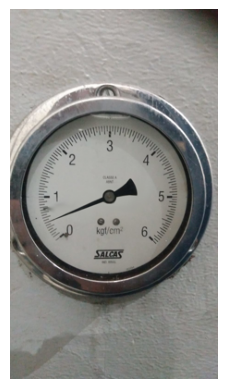

In [ ]:
# Visualizando a imagem processada

plot_image(image_array)

In [ ]:
# Realizando a predição com o modelo treinado

predictions = model_11.predict(image_array)
print(predictions)

1/1 [==============================] - 0s 11ms/step
[[2.4400123e-07 9.9999976e-01 2.6557167e-08 9.7586071e-20 5.0321423e-20
  4.4546292e-19 4.9270556e-15 6.6327859e-22 3.4000537e-18 7.2807482e-10
  1.9950906e-10 3.9907173e-17 8.1359120e-20]]


A variável predictions é um array de probabilidades, correspondente a saída do modelo. Pode-se rearanjar a saída de modo a melhor visualizar o resultado da predição:

In [ ]:
# Loop para identificação dos percentuais de probabilidade e nome das classes

print("Probabilidades para cada classe:")
for class_name, percentage in zip(class_names, predictions[0]*100):
    print(f"{class_name}: {percentage:.2f}%")

print(f"\nA classe predita pelo modelo é: {class_names[predictions[0].argmax()]}")

Probabilidades para cada classe:
0: 0.00%
0_5: 100.00%
1: 0.00%
1_5: 0.00%
2: 0.00%
2_5: 0.00%
3: 0.00%
3_5: 0.00%
4: 0.00%
4_5: 0.00%
5: 0.00%
5_5: 0.00%
6: 0.00%

A classe predita pelo modelo é: 0_5


In [18]:
import numpy as np
from PIL import Image
import matplotlib.pyplot as plt
from tensorflow.keras.models import Model

def load_and_preprocess_image(image_path, target_size):
    image = Image.open(image_path)
    image = image.resize(target_size)
    image_array = np.array(image)
    image_array = image_array / 255.0
    image_array = np.expand_dims(image_array, axis=0)
    return image_array

def plot_image(image_array):
    if image_array.ndim == 4:
        image_array = np.squeeze(image_array, axis=0)
    plt.imshow(image_array)
    plt.axis('off')
    plt.show()

def predict_image_class(model: Model, image_path: str, target_size: tuple, class_names: list):
    image_array = load_and_preprocess_image(image_path, target_size)
    plot_image(image_array)
    
    predictions = model.predict(image_array)
    print("Probabilities for each class:")
    for class_name, percentage in zip(class_names, predictions[0]*100):
        print(f"{class_name}: {percentage:.2f}%")
    print(f"\nThe predicted class is: {class_names[predictions[0].argmax()]}")


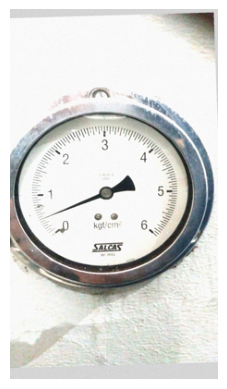

1/1 [==============================] - 0s 121ms/step
Probabilities for each class:
0: 12.69%
0_5: 87.31%
1: 0.00%
1_5: 0.00%
2: 0.00%
2_5: 0.00%
3: 0.00%
3_5: 0.00%
4: 0.00%
4_5: 0.00%
5: 0.00%
5_5: 0.00%
6: 0.00%

The predicted class is: 0_5


In [19]:
# Example usage
image_path = "Test_Classes/0_5/0_5_10c.jpeg"
target_size = (225, 400)
predict_image_class(model_8, image_path, target_size, class_names)
